In [ ]:
from google.colab import drive
import os

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!unzip -q "/content/drive/MyDrive/camvid.zip" -d "/content/camvid"


!ls /content/camvid

class_dict.csv	test_images  test_labels  train  train_labels


In [ ]:
import torch
import numpy as np
import random
import os
import wandb


SEED = 2023471

def set_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seed(SEED)
print(f"✅ Seeds locked to {SEED}")

✅ Seeds locked to 2023471


In [ ]:
import pandas as pd
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import torchvision.transforms as transforms


class_dict = pd.read_csv('/content/camvid/class_dict.csv')
cls_names = class_dict['name'].tolist()
cls_colors = class_dict[['r', 'g', 'b']].values.tolist()

color_to_id = {tuple(c): i for i, c in enumerate(cls_colors)}
id_to_color = {i: tuple(c) for i, c in enumerate(cls_colors)}

class CamVidDataset(Dataset):
    def __init__(self, img_dir, mask_dir, transform=None):
        self.img_dir = img_dir
        self.mask_dir = mask_dir
        self.transform = transform
        self.images = sorted(os.listdir(img_dir))
        self.masks = sorted(os.listdir(mask_dir))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.images[idx])
        mask_path = os.path.join(self.mask_dir, self.masks[idx])

        image = Image.open(img_path).convert("RGB")
        mask_rgb = Image.open(mask_path).convert("RGB")

        image = image.resize((480, 360), Image.BILINEAR)
        mask_rgb = mask_rgb.resize((480, 360), Image.NEAREST)

        if self.transform:
            image = self.transform(image)


        mask_np = np.array(mask_rgb)
        label_mask = np.zeros((360, 480), dtype=np.int64)

        for i, color in enumerate(cls_colors):
            
            match = np.all(mask_np == color, axis=-1)
            label_mask[match] = i

        return image, torch.from_numpy(label_mask)

input_transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


train_dataset = CamVidDataset(img_dir='/content/camvid/train', mask_dir='/content/camvid/train_labels', transform=input_transform)

train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
print(f"Successfully loaded {len(train_dataset)} training samples.")

Successfully loaded 369 training samples.


Calculating pixel-wise class distribution...


Scanning Dataset: 100%|██████████| 47/47 [01:21<00:00,  1.73s/it]


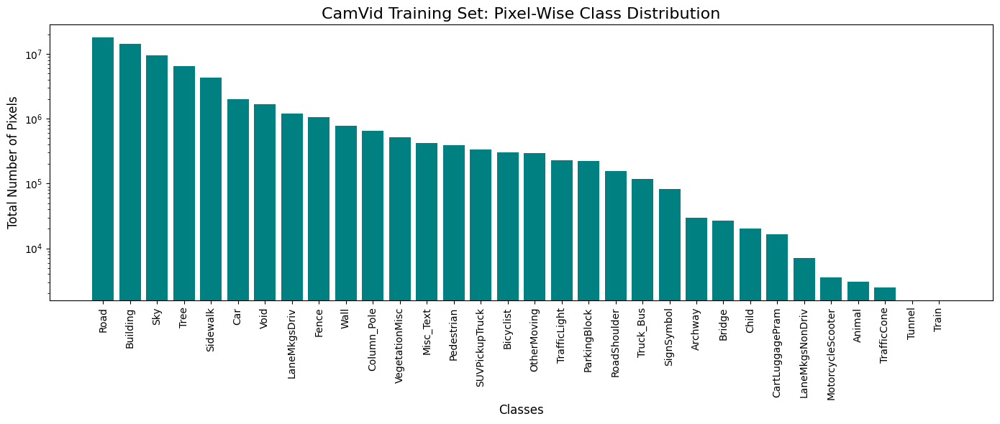


Finding images to visualize for each class...
Plotting results...



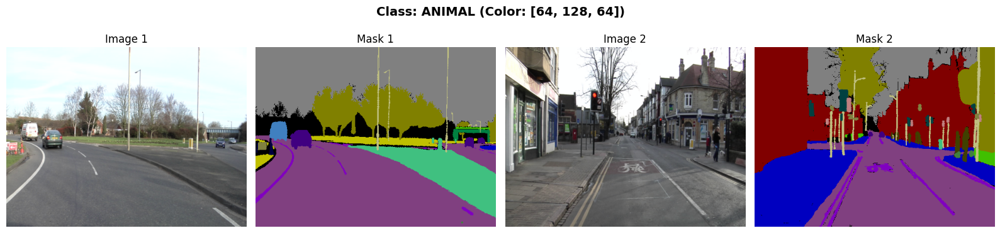

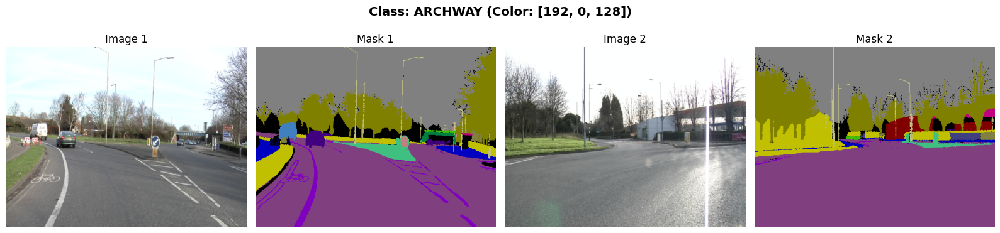

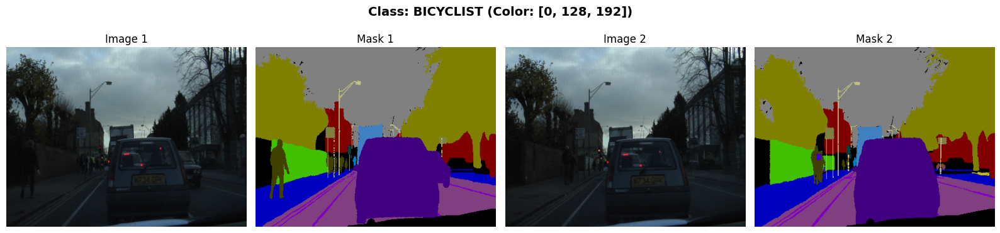

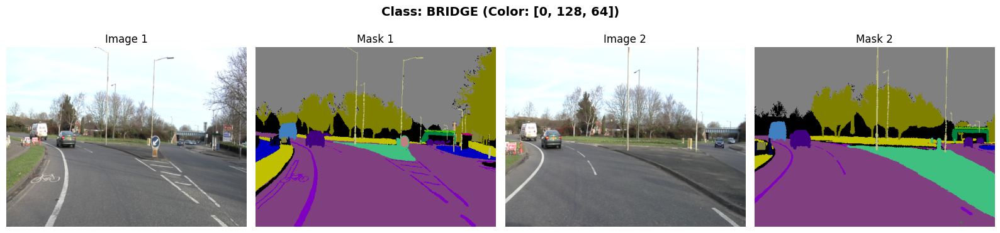

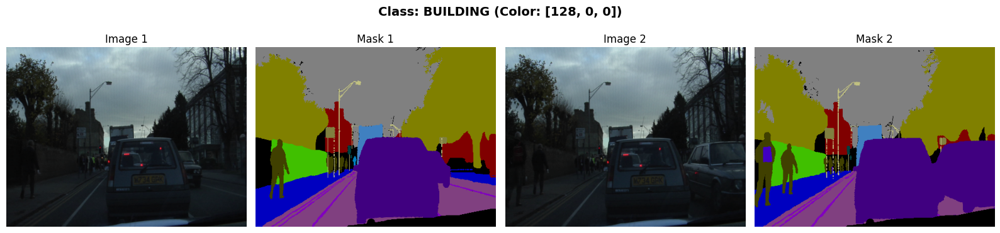

...

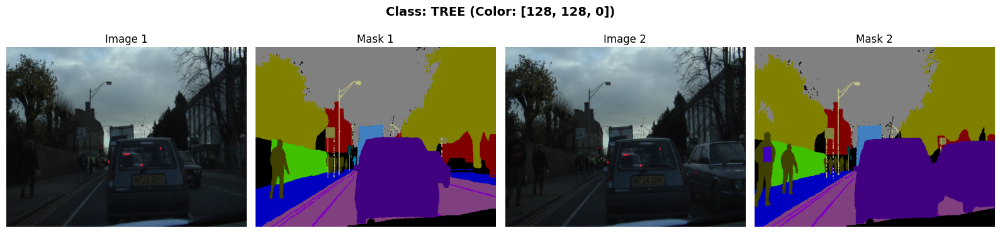

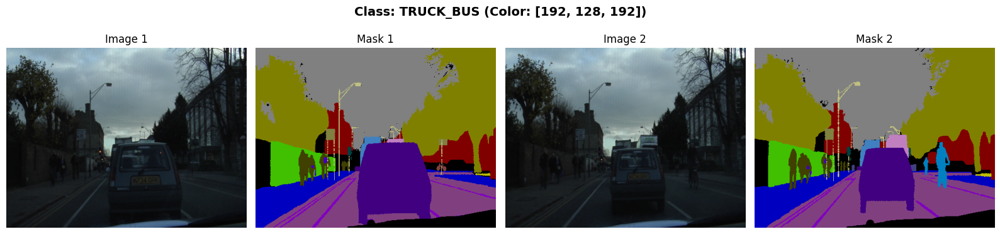

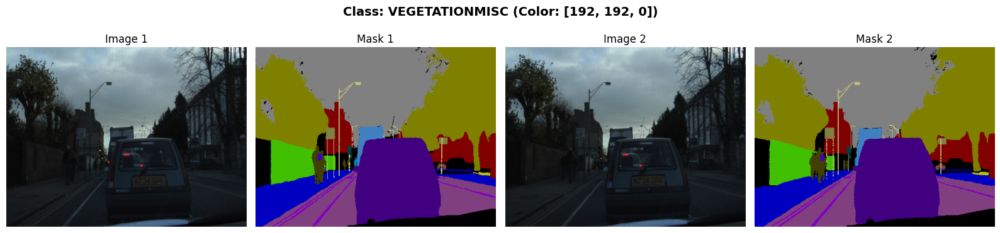

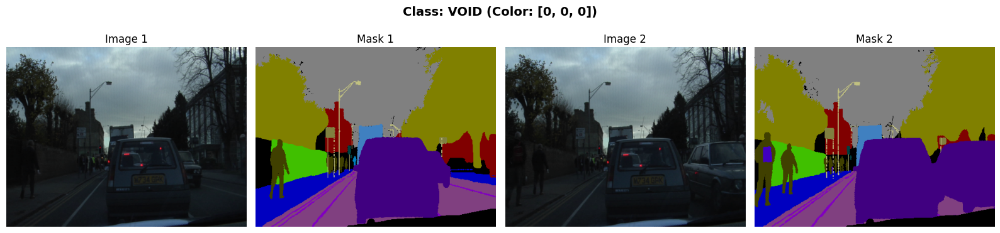

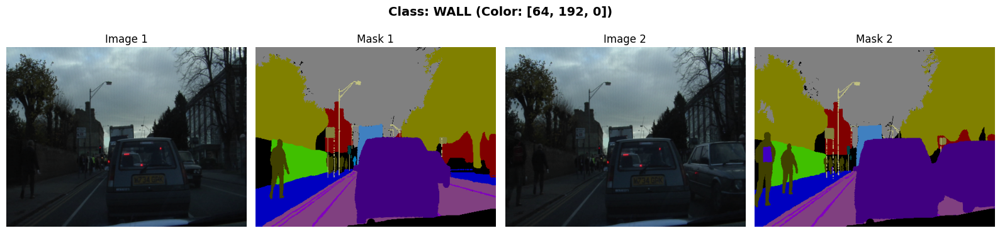

In [ ]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import numpy as np


print("Calculating pixel-wise class distribution...")

class_pixel_counts = np.zeros(len(cls_names), dtype=np.int64)

for images, masks in tqdm(train_loader, desc="Scanning Dataset"):
    counts = torch.bincount(masks.view(-1), minlength=len(cls_names))
    class_pixel_counts += counts.numpy()


plt.figure(figsize=(14, 6))
sorted_indices = np.argsort(class_pixel_counts)[::-1]
sorted_names = [cls_names[i] for i in sorted_indices]
sorted_counts = class_pixel_counts[sorted_indices]

plt.bar(sorted_names, sorted_counts, color='teal')
plt.title("CamVid Training Set: Pixel-Wise Class Distribution", fontsize=16)
plt.xlabel("Classes", fontsize=12)
plt.ylabel("Total Number of Pixels", fontsize=12)
plt.xticks(rotation=90)
plt.yscale('log')
plt.tight_layout()
plt.show()


print("\nFinding images to visualize for each class...")


def decode_mask(mask_2d):
    rgb_mask = np.zeros((360, 480, 3), dtype=np.uint8)
    for i, color in enumerate(cls_colors):
        rgb_mask[mask_2d == i] = color
    return rgb_mask


def unnormalize_img(img_tensor):
    img = img_tensor.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    img = std * img + mean
    return np.clip(img, 0, 1)

class_to_img_indices = {i: [] for i in range(len(cls_names))}

for idx in range(len(train_dataset)):
    _, mask = train_dataset[idx]
    present_classes = torch.unique(mask).tolist()

    for c in present_classes:
        if len(class_to_img_indices[c]) < 2:
            class_to_img_indices[c].append(idx)

    if all(len(indices) >= 2 for indices in class_to_img_indices.values()):
        break

print("Plotting results...\n")

for class_id, indices in class_to_img_indices.items():
    if len(indices) == 0:
        continue 

    class_name = cls_names[class_id]

    fig, axes = plt.subplots(1, 4, figsize=(16, 4))
    fig.suptitle(f"Class: {class_name.upper()} (Color: {cls_colors[class_id]})", fontsize=14, fontweight='bold')

    for i, img_idx in enumerate(indices):
        if i >= 2: break 

        img_tensor, mask_tensor = train_dataset[img_idx]

        axes[i*2].imshow(unnormalize_img(img_tensor))
        axes[i*2].set_title(f"Image {i+1}")
        axes[i*2].axis('off')

        axes[i*2 + 1].imshow(decode_mask(mask_tensor.numpy()))
        axes[i*2 + 1].set_title(f"Mask {i+1}")
        axes[i*2 + 1].axis('off')

    plt.tight_layout()
    plt.show()

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
from torchvision import models,transforms
class SegNet_Encoder(nn.Module):

    def __init__(self, in_chn=3, out_chn=32, BN_momentum=0.5):
        super(SegNet_Encoder, self).__init__()


        self.in_chn = in_chn
        self.out_chn = out_chn

        self.MaxEn = nn.MaxPool2d(2, stride=2, return_indices=True)

        self.ConvEn11 = nn.Conv2d(self.in_chn, 64, kernel_size=3, padding=1)
        self.BNEn11 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.ConvEn12 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.BNEn12 = nn.BatchNorm2d(64, momentum=BN_momentum)

        self.ConvEn21 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.BNEn21 = nn.BatchNorm2d(128, momentum=BN_momentum)
        self.ConvEn22 = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        self.BNEn22 = nn.BatchNorm2d(128, momentum=BN_momentum)

        self.ConvEn31 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.BNEn31 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvEn32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNEn32 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvEn33 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNEn33 = nn.BatchNorm2d(256, momentum=BN_momentum)

        self.ConvEn41 = nn.Conv2d(256, 512, kernel_size=3, padding=1)
        self.BNEn41 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn42 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn43 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn43 = nn.BatchNorm2d(512, momentum=BN_momentum)

        self.ConvEn51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn51 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn52 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvEn53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNEn53 = nn.BatchNorm2d(512, momentum=BN_momentum)
    def forward(self,x):

        x = F.relu(self.BNEn11(self.ConvEn11(x)))
        x = F.relu(self.BNEn12(self.ConvEn12(x)))
        x, ind1 = self.MaxEn(x)
        size1 = x.size()


        x = F.relu(self.BNEn21(self.ConvEn21(x)))
        x = F.relu(self.BNEn22(self.ConvEn22(x)))
        x, ind2 = self.MaxEn(x)
        size2 = x.size()


        x = F.relu(self.BNEn31(self.ConvEn31(x)))
        x = F.relu(self.BNEn32(self.ConvEn32(x)))
        x = F.relu(self.BNEn33(self.ConvEn33(x)))
        x, ind3 = self.MaxEn(x)
        size3 = x.size()


        x = F.relu(self.BNEn41(self.ConvEn41(x)))
        x = F.relu(self.BNEn42(self.ConvEn42(x)))
        x = F.relu(self.BNEn43(self.ConvEn43(x)))
        x, ind4 = self.MaxEn(x)
        size4 = x.size()


        x = F.relu(self.BNEn51(self.ConvEn51(x)))
        x = F.relu(self.BNEn52(self.ConvEn52(x)))
        x = F.relu(self.BNEn53(self.ConvEn53(x)))
        x, ind5 = self.MaxEn(x)
        size5 = x.size()
        return x,[ind1,ind2,ind3,ind4,ind5],[size1,size2,size3,size4,size5]



class SegNet_Decoder(nn.Module):
    def __init__(self, in_chn=3, out_chn=32, BN_momentum=0.5):
        super(SegNet_Decoder, self).__init__()
        self.in_chn = in_chn
        self.out_chn = out_chn


        self.MaxDe = nn.MaxUnpool2d(2, stride=2)

        self.ConvDe51 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe51 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe52 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe52 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe53 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe53 = nn.BatchNorm2d(512, momentum=BN_momentum)

        self.ConvDe41 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe41 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe42 = nn.Conv2d(512, 512, kernel_size=3, padding=1)
        self.BNDe42 = nn.BatchNorm2d(512, momentum=BN_momentum)
        self.ConvDe43 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.BNDe43 = nn.BatchNorm2d(256, momentum=BN_momentum)

        self.ConvDe31 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNDe31 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvDe32 = nn.Conv2d(256, 256, kernel_size=3, padding=1)
        self.BNDe32 = nn.BatchNorm2d(256, momentum=BN_momentum)
        self.ConvDe33 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.BNDe33 = nn.BatchNorm2d(128, momentum=BN_momentum)

        self.ConvDe21 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.BNDe21 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.ConvDe22 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.BNDe22 = nn.BatchNorm2d(64, momentum=BN_momentum)

        self.ConvDe11 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.BNDe11 = nn.BatchNorm2d(64, momentum=BN_momentum)
        self.ConvDe12 = nn.Conv2d(64, out_chn, kernel_size=3, padding=1)
        self.BNDe12 = nn.BatchNorm2d(out_chn, momentum=BN_momentum)

    def forward(self, x, indexes, sizes):
        ind1, ind2, ind3, ind4, ind5 = indexes[0], indexes[1], indexes[2], indexes[3], indexes[4]
        size1, size2, size3, size4, size5 = sizes[0], sizes[1], sizes[2], sizes[3], sizes[4]

        x = self.MaxDe(x, ind5, output_size=size4)
        x = F.relu(self.BNDe51(self.ConvDe51(x)))
        x = F.relu(self.BNDe52(self.ConvDe52(x)))
        x = F.relu(self.BNDe53(self.ConvDe53(x)))

        x = self.MaxDe(x, ind4, output_size=size3)
        x = F.relu(self.BNDe41(self.ConvDe41(x)))
        x = F.relu(self.BNDe42(self.ConvDe42(x)))
        x = F.relu(self.BNDe43(self.ConvDe43(x)))

        x = self.MaxDe(x, ind3, output_size=size2)
        x = F.relu(self.BNDe31(self.ConvDe31(x)))
        x = F.relu(self.BNDe32(self.ConvDe32(x)))
        x = F.relu(self.BNDe33(self.ConvDe33(x)))

        x = self.MaxDe(x, ind2, output_size=size1)
        x = F.relu(self.BNDe21(self.ConvDe21(x)))
        x = F.relu(self.BNDe22(self.ConvDe22(x)))


        x = self.MaxDe(x, ind1)
        x = F.relu(self.BNDe11(self.ConvDe11(x)))
        x = self.BNDe12(self.ConvDe12(x))

        return x


class DeepLabV3(nn.Module):
    def __init__(self, num_classes=32):
        super(DeepLabV3, self).__init__()3
        self.model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)

        self.model.classifier[4] = nn.Conv2d(256, num_classes, kernel_size=1, stride=1)

    def forward(self, x):
        return self.model(x)['out']





class SegNet_Pretrained(nn.Module):
    def __init__(self,encoder_weight_pth,in_chn=3, out_chn=32):
        super(SegNet_Pretrained, self).__init__()
        self.in_chn = in_chn
        self.out_chn = out_chn
        self.encoder=SegNet_Encoder(in_chn=self.in_chn,out_chn=self.out_chn)
        self.decoder=SegNet_Decoder(in_chn=self.in_chn,out_chn=self.out_chn)
        encoder_state_dict = torch.load(encoder_weight_pth,weights_only=True)


        self.encoder.load_state_dict(encoder_state_dict)

        for param in self.encoder.parameters():
            param.requires_grad = False

    def forward(self,x):
        x,indexes,sizes=self.encoder(x)
        x=self.decoder(x,indexes,sizes)
        return x


In [ ]:
import torch.optim as optim
import torch.nn as nn
import wandb
import torch

print("1. Setting up device...")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

print("2. Loading Model Weights...")
encoder_weights_path = '/content/drive/MyDrive/encoder_model.pth'
model = SegNet_Pretrained(encoder_weight_pth=encoder_weights_path, in_chn=3, out_chn=len(cls_names)).to(device)
print("Model loaded and moved to GPU successfully!")

print("3. Setting up optimizer...")
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

print("4. Initializing WandB...")
wandb.login()
wandb.init(project="camvid-segmentation", name="segnet-decoder-training")
print("WandB initialized successfully!")

num_epochs = 10

print("5. Starting SegNet Decoder Training Loop...")
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0

    for step, (images, masks) in enumerate(train_loader):
        images, masks = images.to(device), masks.to(device)

        outputs = model(images)
        loss = criterion(outputs, masks)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

        if (step + 1) % 10 == 0:
            print(f"   -> Batch [{step+1}/{len(train_loader)}] Loss: {loss.item():.4f}")

    avg_train_loss = running_loss / len(train_loader)


    wandb.log({"Train Loss": avg_train_loss, "Epoch": epoch + 1})
    print(f"*** Epoch [{epoch+1}/{num_epochs}] Complete! Average Train Loss: {avg_train_loss:.4f} ***\n")

wandb.finish()
print("Training Complete!")

1. Setting up device...
Using device: cuda
2. Loading Model Weights...
Model loaded and moved to GPU successfully!
3. Setting up optimizer...
4. Initializing WandB...


/usr/local/lib/python3.12/dist-packages/notebook/notebookapp.py:191: SyntaxWarning: invalid escape sequence '\/'
  | |_| | '_ \/ _` / _` |  _/ -_)
wandb: (1) Create a W&B account
wandb: (2) Use an existing W&B account
wandb: (3) Don't visualize my results
wandb: Enter your choice:

 2


wandb: You chose 'Use an existing W&B account'
wandb: Logging into https://api.wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: Create a new API key at: https://wandb.ai/authorize?ref=models
wandb: Store your API key securely and do not share it.
wandb: Paste your API key and hit enter:

 ··········


wandb: No netrc file found, creating one.
wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc
wandb: Currently logged in as: sakshamnow17 (sakshamnow17-indraprastha-institute-of-information-techn) to https://api.wandb.ai. Use `wandb login --relogin` to force relogin


WandB initialized successfully!
5. Starting SegNet Decoder Training Loop...
   -> Batch [10/47] Loss: 2.6478
   -> Batch [20/47] Loss: 2.2482
   -> Batch [30/47] Loss: 2.2364
   -> Batch [40/47] Loss: 2.1307
*** Epoch [1/10] Complete! Average Train Loss: 2.4188 ***

   -> Batch [10/47] Loss: 1.8540
   -> Batch [20/47] Loss: 1.8457
   -> Batch [30/47] Loss: 1.6976
   -> Batch [40/47] Loss: 1.7514
*** Epoch [2/10] Complete! Average Train Loss: 1.8250 ***

   -> Batch [10/47] Loss: 1.6387
   -> Batch [20/47] Loss: 1.6383
   -> Batch [30/47] Loss: 1.6566
   -> Batch [40/47] Loss: 1.5435
*** Epoch [3/10] Complete! Average Train Loss: 1.6552 ***

   -> Batch [10/47] Loss: 1.5551
   -> Batch [20/47] Loss: 1.5079
   -> Batch [30/47] Loss: 1.5247
   -> Batch [40/47] Loss: 1.4749
*** Epoch [4/10] Complete! Average Train Loss: 1.5351 ***

   -> Batch [10/47] Loss: 1.3189
   -> Batch [20/47] Loss: 1.3596
   -> Batch [30/47] Loss: 1.3558
   -> Batch [40/47] Loss: 1.4282
*** Epoch [5/10] Complete! A

Epoch,▁▂▃▃▄▅▆▆▇█
Train Loss,█▅▄▄▃▂▂▂▁▁
Epoch,10
Train Loss,0.9998


Training Complete!


In [ ]:
!pip install scipy

In [ ]:
import numpy as np
import pandas as pd
import torch
from tqdm.notebook import tqdm
from scipy.ndimage import label

print("1. Loading Test Dataset...")
test_dataset = CamVidDataset(
    img_dir='/content/camvid/test_images',
    mask_dir='/content/camvid/test_labels',
    transform=input_transform
)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

print("2. Evaluating Model on Test Set...")
model.eval()

num_classes = len(cls_names)
iou_thresholds = np.arange(0.0, 1.1, 0.1)

conf_matrix = np.zeros((num_classes, num_classes), dtype=np.int64)

TP_inst = np.zeros((num_classes, len(iou_thresholds)))
FP_inst = np.zeros((num_classes, len(iou_thresholds)))
FN_inst = np.zeros((num_classes, len(iou_thresholds)))

with torch.no_grad():
    for images, masks in tqdm(test_loader, desc="Evaluating"):
        images, masks = images.to(device), masks.to(device)
        outputs = model(images)
        preds = torch.argmax(outputs, dim=1)

        preds_flat = preds.view(-1).cpu().numpy()
        masks_flat = masks.view(-1).cpu().numpy()

        valid_pixels = (masks_flat >= 0) & (masks_flat < num_classes)
        matrix = np.bincount(
            num_classes * masks_flat[valid_pixels] + preds_flat[valid_pixels],
            minlength=num_classes ** 2
        ).reshape(num_classes, num_classes)
        conf_matrix += matrix


        for b in range(images.size(0)):
            pred_img = preds[b].cpu().numpy()
            mask_img = masks[b].cpu().numpy()

            for c in range(num_classes):

                pred_c = (pred_img == c)
                mask_c = (mask_img == c)

                pred_labels, num_pred = label(pred_c)
                target_labels, num_target = label(mask_c)

                if num_target == 0:
                    FP_inst[c, :] += num_pred
                    continue

    
                if num_pred == 0:
                    FN_inst[c, :] += num_target
                    continue

  
                matched_targets = set()

                for p_idx in range(1, num_pred + 1):
                    p_mask = (pred_labels == p_idx)
                    best_iou = 0
                    best_t_idx = -1

                    for t_idx in range(1, num_target + 1):
                        t_mask = (target_labels == t_idx)

                        intersection = np.logical_and(p_mask, t_mask).sum()
                        union = np.logical_or(p_mask, t_mask).sum()
                        iou = intersection / union if union > 0 else 0

                        if iou > best_iou:
                            best_iou = iou
                            best_t_idx = t_idx


                    for thresh_idx, thresh in enumerate(iou_thresholds):
                        if best_iou >= thresh and best_t_idx not in matched_targets:
                            TP_inst[c, thresh_idx] += 1
                            matched_targets.add(best_t_idx) 
                        else:
                            FP_inst[c, thresh_idx] += 1

                for thresh_idx, thresh in enumerate(iou_thresholds):
                    unmatched = num_target - TP_inst[c, thresh_idx]
                    FN_inst[c, thresh_idx] += unmatched

print("\n3. Calculating Final Metrics...")
eps = 1e-6


TP = np.diag(conf_matrix)
FP = np.sum(conf_matrix, axis=0) - TP
FN = np.sum(conf_matrix, axis=1) - TP

pixel_accuracy = (TP.sum()) / (conf_matrix.sum() + eps)
class_iou = TP / (TP + FP + FN + eps)
class_dice = (2 * TP) / ((2 * TP) + FP + FN + eps)

precision_at_t = TP_inst / (TP_inst + FP_inst + eps)
recall_at_t = TP_inst / (TP_inst + FN_inst + eps)

avg_precision = np.mean(precision_at_t, axis=1)
avg_recall = np.mean(recall_at_t, axis=1)

results_dict = {'Class': cls_names,'Pixel_Acc': TP / (TP + FN + eps),'IoU': class_iou,'Dice': class_dice,'Inst_Precision': avg_precision,'Inst_Recall': avg_recall}
df_metrics = pd.DataFrame(results_dict)

valid_classes = (TP + FN) > 0
miou = np.mean(class_iou[valid_classes])
mean_dice = np.mean(class_dice[valid_classes])

print("="*60)
print(f"✅ Overall Semantic Pixel Accuracy: {pixel_accuracy * 100:.2f}%")
print(f"✅ Mean Semantic IoU (mIoU): {miou:.4f}")
print(f"✅ Mean Semantic Dice Coefficient: {mean_dice:.4f}")
print("="*60)
print("\nClass-wise Performance:")

pd.set_option('display.max_rows', None)
print(df_metrics[valid_classes].round(4).to_string(index=False))

1. Loading Test Dataset...
2. Evaluating Model on Test Set...


Evaluating:   0%|          | 0/29 [00:00<?, ?it/s]


3. Calculating Final Metrics...
✅ Overall Semantic Pixel Accuracy: 76.44%
✅ Mean Semantic IoU (mIoU): 0.1827
✅ Mean Semantic Dice Coefficient: 0.2350

Class-wise Performance:
            Class  Pixel_Acc    IoU   Dice  Inst_Precision  Inst_Recall
           Animal     0.0000 0.0000 0.0000          0.0000       0.0000
          Archway     0.0000 0.0000 0.0000          0.0000       0.0000
        Bicyclist     0.3007 0.1773 0.3012          0.0031      -0.0014
           Bridge     0.0000 0.0000 0.0000          0.0000       0.0000
         Building     0.8370 0.6974 0.8217          0.0100      -0.0009
              Car     0.8524 0.5308 0.6935          0.0153      -0.0008
  CartLuggagePram     0.0000 0.0000 0.0000          0.0000       0.0000
            Child     0.0000 0.0000 0.0000          0.0000       0.0000
      Column_Pole     0.0858 0.0659 0.1237          0.0064      -0.0010
            Fence     0.5295 0.1382 0.2429          0.0012      -0.0021
     LaneMkgsDriv     0.5952 0.4

Hunting for failing images (IoU <= 0.5)...
Plotting the failures...



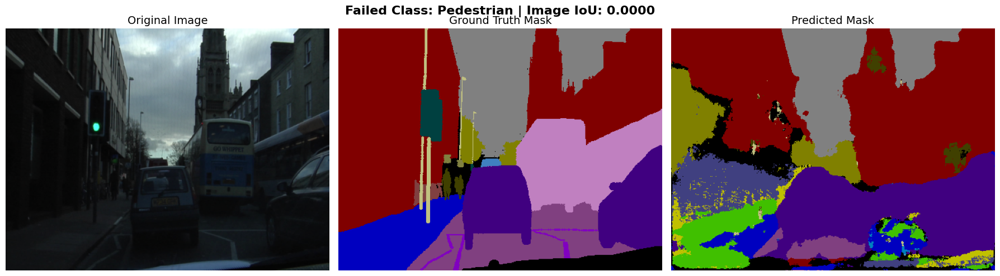

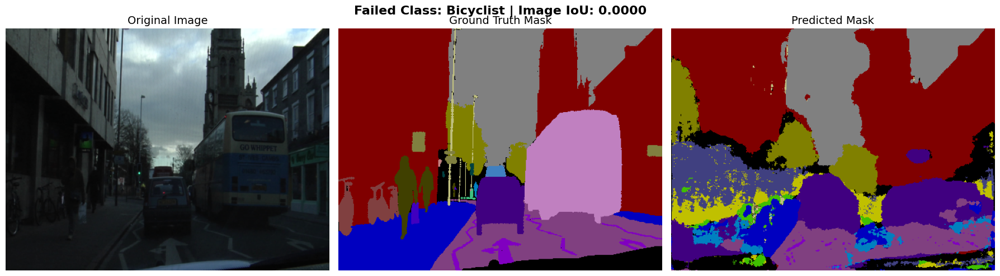

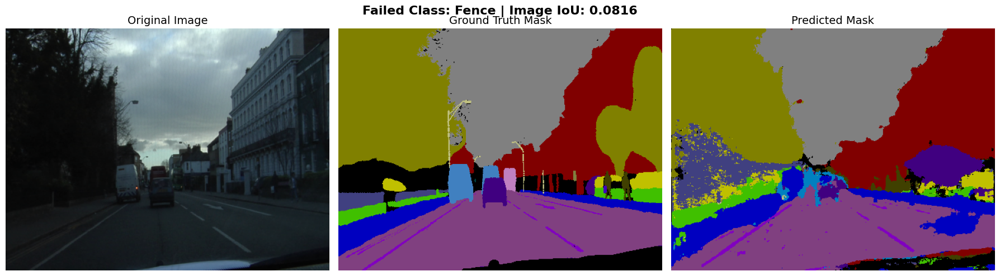

In [ ]:
import matplotlib.pyplot as plt
import torch

print("Hunting for failing images (IoU <= 0.5)...")

target_classes = ['Pedestrian', 'Bicyclist', 'Fence']
target_class_ids = [cls_names.index(c) for c in target_classes]
found_images = []

model.eval()
with torch.no_grad():
    for idx in range(len(test_dataset)):
        img_tensor, mask_tensor = test_dataset[idx]

        img_input = img_tensor.unsqueeze(0).to(device)
        output = model(img_input)
        pred_mask = torch.argmax(output, dim=1).squeeze(0).cpu()

        for t_idx, class_id in enumerate(target_class_ids):
            if class_id in mask_tensor: 


                intersection = torch.logical_and(pred_mask == class_id, mask_tensor == class_id).sum().item()
                union = torch.logical_or(pred_mask == class_id, mask_tensor == class_id).sum().item()

                if union > 0:
                    img_iou = intersection / union
                    if img_iou <= 0.5:
                        found_images.append({
                            'class_name': target_classes[t_idx],
                            'iou': img_iou,
                            'img': img_tensor,
                            'true_mask': mask_tensor,
                            'pred_mask': pred_mask
                        })
                     
                        target_class_ids.pop(t_idx)
                        target_classes.pop(t_idx)
                        break 

        if len(found_images) >= 3:
            break

print("Plotting the failures...\n")

for item in found_images:
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    fig.suptitle(f"Failed Class: {item['class_name']} | Image IoU: {item['iou']:.4f}", fontsize=16, fontweight='bold')

    axes[0].imshow(unnormalize_img(item['img']))
    axes[0].set_title("Original Image", fontsize=14)
    axes[0].axis('off')


    axes[1].imshow(decode_mask(item['true_mask'].numpy()))
    axes[1].set_title("Ground Truth Mask", fontsize=14)
    axes[1].axis('off')


    axes[2].imshow(decode_mask(item['pred_mask'].numpy()))
    axes[2].set_title("Predicted Mask", fontsize=14)
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()